In [1]:
import os
import cv2
import torch
import numpy as np
import torchvision
from pathlib import Path
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

import sys
sys.path.append("../")

from custom_functions.utils import conv1d, change_range

In [2]:
image_root = Path("../images")
image_paths = list(image_root.glob("*"))

In [3]:
img = plt.imread(image_paths[0].as_posix())
# img = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray,100,200)
img_bin = cv2.adaptiveThreshold(gray,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)

# Image histogram

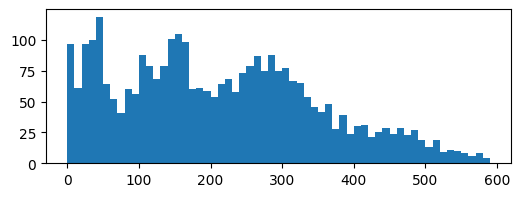

In [4]:
plt.figure(figsize=(6,2))
plt.hist((edges>0).sum(axis=0), bins=range(0,600,10))
plt.show()

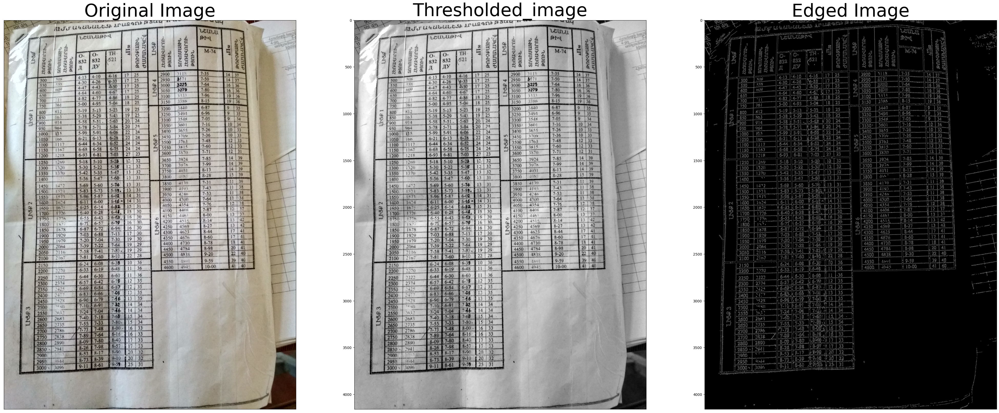

In [5]:
plt.figure(figsize=(50,50))
plt.subplot(131),plt.imshow(img)
plt.title('Original Image', fontsize=50), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(gray,cmap = 'gray')
plt.title('Thresholded_image', fontsize=50), plt.xticks([])
plt.subplot(133),plt.imshow(edges,cmap = 'gray')
plt.title('Edged Image', fontsize=50), plt.xticks([])
plt.show()

# Applying horizontal and Vertical kernels to the edged image

In [6]:
line_min_width = 10

kernel_h = np.ones((1,line_min_width), np.uint8)
kernel_v = np.ones((line_min_width,1), np.uint8)

img_bin_h = cv2.morphologyEx(edges, cv2.MORPH_OPEN, kernel_h)
img_bin_v = cv2.morphologyEx(edges, cv2.MORPH_OPEN, kernel_v)

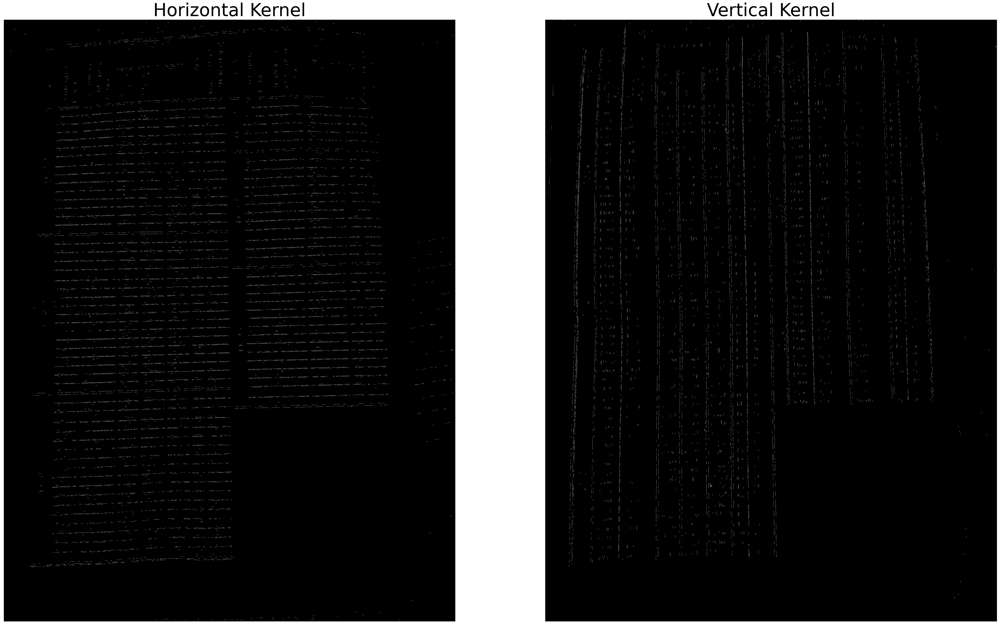

In [7]:
plt.figure(figsize=(50,50))


plt.subplot(121),plt.imshow(img_bin_h, cmap="gray")
plt.title('Horizontal Kernel', fontsize=50), plt.xticks([]), plt.yticks([])


plt.subplot(122),plt.imshow(img_bin_v, cmap="gray")
plt.title('Vertical Kernel', fontsize=50), plt.xticks([]), plt.yticks([])
plt.show()

# Filling the gaps between the lines

In [49]:
np.repeat(np.array([0,1,0],dtype=np.uint8)[...,None], line_min_width, axis=1)


array([[0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0]], dtype=uint8)

In [50]:
dilation_count = 5
erode_count = 2
line_min_width = 10

# kernel_h = np.ones((3,line_min_width), np.uint8)
# kernel_v = np.ones((line_min_width,3), np.uint8)
kernel_h = np.repeat(np.array([0,1,0],dtype=np.uint8)[...,None], line_min_width, axis=1)
kernel_v = kernel_h.T

img_bin_h = cv2.morphologyEx(edges, cv2.MORPH_OPEN, kernel_h)
img_bin_v = cv2.morphologyEx(edges, cv2.MORPH_OPEN, kernel_v)

kernel = np.ones((10,100), np.uint8)
img_bin_h = cv2.dilate(img_bin_h, kernel, dilation_count)
img_bin_h = cv2.erode(img_bin_h, kernel, erode_count) 

kernel = np.ones((100,10), np.uint8)
img_bin_v = cv2.dilate(img_bin_v, kernel, dilation_count)
img_bin_v = cv2.erode(img_bin_v, kernel, erode_count) 

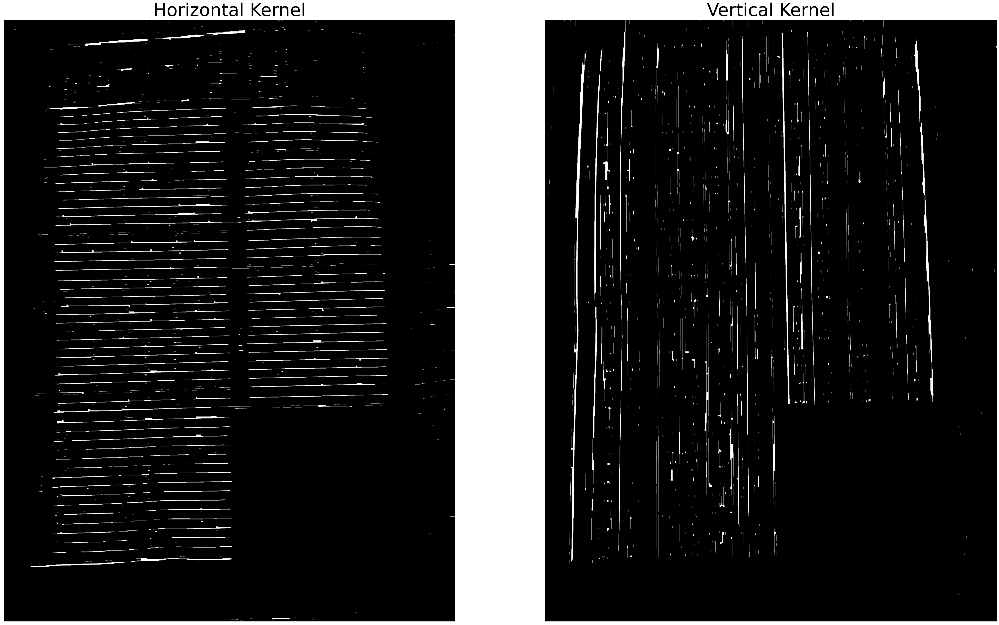

In [51]:
plt.figure(figsize=(50,50))

plt.subplot(121),plt.imshow(img_bin_h, cmap="gray")
plt.title('Horizontal Kernel', fontsize=50), plt.xticks([]), plt.yticks([])

plt.subplot(122),plt.imshow(img_bin_v, cmap="gray")
plt.title('Vertical Kernel', fontsize=50), plt.xticks([]), plt.yticks([])
plt.show()

# Combining the lines by element-wise and (&)

### The resulting dots are going to be the points of the cells

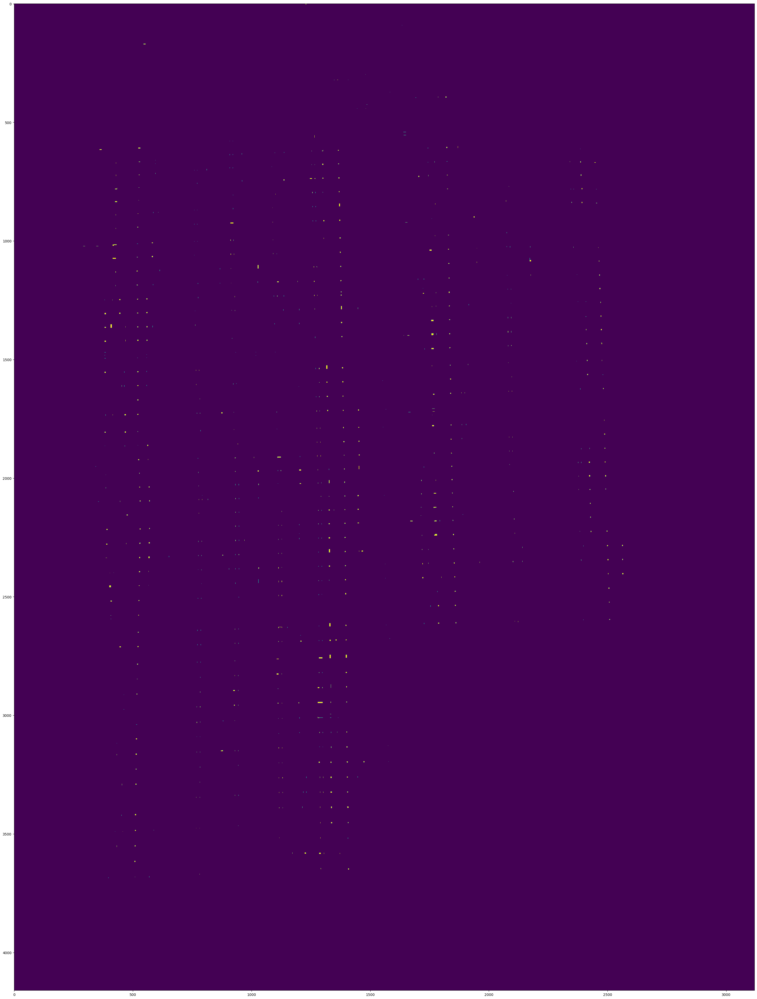

In [10]:
plt.figure(figsize=(50,50))

img_bin_final=img_bin_h&img_bin_v

# `labels` is a GrayScale image with each connected Component getting assigned to a different value from its neighbour.
# `stats` is a tuple of lists with each tuple having (x,y,w,h,area) of the detected bounding boxes.
_, labels, stats,_ = cv2.connectedComponentsWithStats(~img_bin_final, connectivity=8, ltype=cv2.CV_32S)

plt.imshow(img_bin_final)

# With Peak finding

In [11]:
horizontal_lines = conv1d(img_bin_h.std(axis=1),kernel_size=50)
vertical_lines = conv1d(img_bin_v.std(axis=0),kernel_size=50)

min_peak_height = 20
min_peak_width = 5
min_peak_distance = 1

h_peaks, h_P = find_peaks(horizontal_lines, height=min_peak_height, width=min_peak_width, distance=min_peak_distance, prominence=3)
v_peaks, v_P = find_peaks(vertical_lines, height=min_peak_height, width=min_peak_width, distance=min_peak_distance, prominence=3)

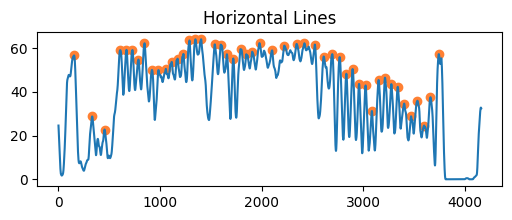

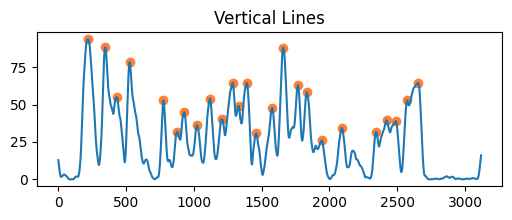

In [12]:
plt.figure(figsize=(6,2))
plt.title("Horizontal Lines")
plt.plot(horizontal_lines)
plt.scatter(h_peaks, horizontal_lines[h_peaks], color=(1,0.5,0.2), marker="o")
plt.show()

plt.figure(figsize=(6,2))
plt.title("Vertical Lines")
plt.plot(vertical_lines)
plt.scatter(v_peaks, vertical_lines[v_peaks], color=(1,0.5,0.2), marker="o")
plt.show()

In [13]:
img_bin_final_red = np.concatenate((img_bin_final[...,None], np.zeros(img_bin_final.shape + (2,),dtype=np.uint8)),axis=-1)
merged = (img.copy()*0.2).astype(np.uint8)
merged[img_bin_final_red>0] = img_bin_final_red[img_bin_final_red>0]

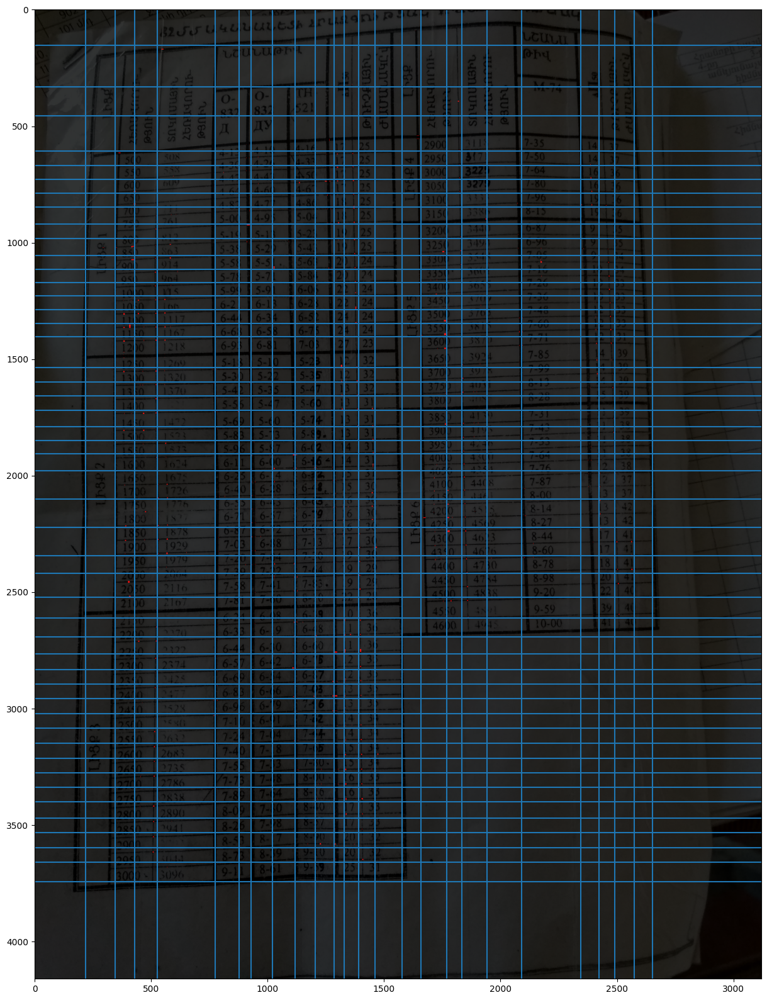

In [14]:
plt.figure(figsize=(20,20))
plt.hlines(h_peaks,0,img.shape[1])
plt.vlines(v_peaks,0,img.shape[0])
plt.imshow(merged)

# Clustering

In [15]:
from sklearn.cluster import AgglomerativeClustering as AGC

In [16]:
AGC_ = AGC(n_clusters=None, distance_threshold=30)

points = np.stack(np.where(img_bin_final>0)).transpose(1,0)
clustered=(AGC_.fit_predict(points))

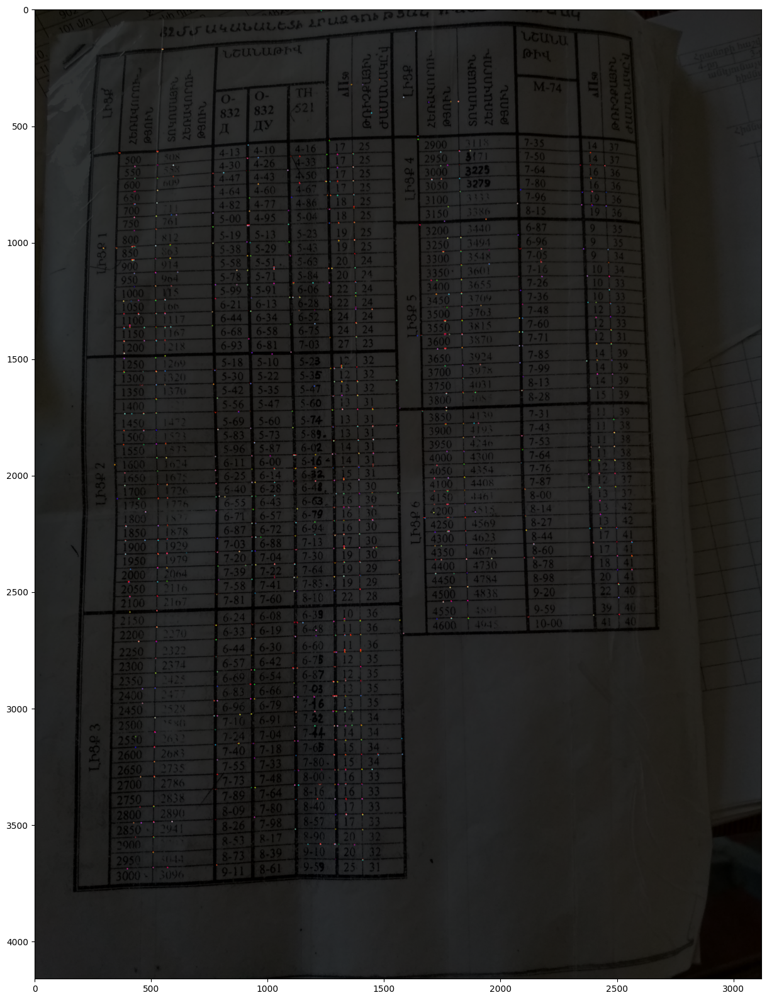

In [17]:
uniques_ = np.unique(clustered)
plt.figure(figsize=(20,20))
plt.imshow(merged)
for unique_ in uniques_:
    area_points = points[ np.where(clustered==unique_)[0] ]
    area_center = np.mean(area_points,axis=0)
    plt.scatter(area_center[1],area_center[0],color=tuple(np.random.random(3)), marker=".", s=1 )
    
plt.show()

In [18]:
5 | 2 , 2<<5

(7, 64)